In [3]:
pip install yfinance

Note: you may need to restart the kernel to use updated packages.


In [1]:
#library for basic yahoo finance
import numpy as np
import random
import matplotlib.pyplot as plt
import yfinance as yf
import pandas as pd
import requests
from bs4 import BeautifulSoup


In [2]:
#Testing
#Getting S&P500 stock data
#source: https://python.plainenglish.io/scraping-and-exploring-the-s-p-500-with-python-853ccf4b2df5
        #https://stackoverflow.com/questions/66483773/importing-historical-sp-500-data-in-python

table = pd.read_html('https://en.wikipedia.org/wiki/List_of_S%26P_500_companies');
df = table[0];
stockdata = df['Symbol'].to_list();
full_stock_data = yf.download(stockdata, '2018-11-01', '2023-11-01');
print(full_stock_data['Volume']);

df.to_csv('S&P500-Info.csv');
df.to_csv("S&P500-Symbols.csv", columns=['Symbol']);

[*********************100%%**********************]  503 of 503 completed


2 Failed downloads:
['BF.B']: Exception('%ticker%: No price data found, symbol may be delisted (1d 2018-11-01 -> 2023-11-01)')


['BRK.B']: Exception('%ticker%: No timezone found, symbol may be delisted')


                  A       AAL       AAPL      ABBV       ABNB      ABT  \
Date                                                                     
2018-11-01  1882400   9643200  233292800  10671700        NaN  6250800   
2018-11-02  2272100  10039100  365314800  12781500        NaN  5314600   
2018-11-05  2348700  11305300  264654800  10315600        NaN  8558700   
2018-11-06  2287300  11376700  127531600   7945500        NaN  3676400   
2018-11-07  2700600  10904000  133697600  10378000        NaN  6404500   
...             ...       ...        ...       ...        ...      ...   
2023-10-25  2699600  40461800   57157000   5461500  4844500.0  8157700   
2023-10-26  1599100  40009500   70625300   5569400  5217500.0  6838100   
2023-10-27  2004000  39890700   58499100   9427200  5201600.0  5934100   
2023-10-30  3684900  38208500   51131000   9258500  5218000.0  7168900   
2023-10-31  2218800  42086200   44846000  10394000  4647400.0  7452300   

               ACGL      ACN     ADBE

## Data Collection and testing preparation

[*********************100%%**********************]  51 of 51 completed


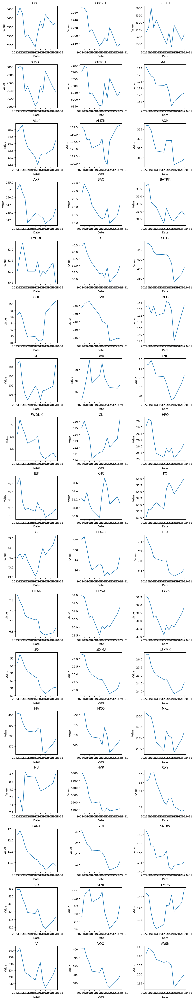

In [2]:
#Real Buffet stock portfolio data is downloaded already:
#Source: https://www.cnbc.com/berkshire-hathaway-portfolio/
#Date:September 30,2023
real_df = pd.read_csv('Buffett.csv')
Buffett_Stock_List = real_df['Symbol'];
#print(Buffett_Stock_List)
Stock_List = Buffett_Stock_List.tolist();

#Now, download recent last 12 daily 50 Buffet stocks data through yahoo finance plugin
full_data = yf.download(Stock_List,'2023-10-16', '2023-11-01')
#Loading data for computation in csv file
full_data.to_csv('Buffett_Stock_Info.csv');
Adj_close = full_data['Adj Close']

Adj_close.to_csv('Buffett_Stock_Adjclose.csv');

#Load the sticker name for buffet stock portfolio
Sticker = Adj_close.columns

#Testing: Draw 2d Line plot for those 51 stock prices value versus time
num_series = len(Sticker)
num_rows = num_series // 3 + num_series % 3

fig, axes = plt.subplots(num_rows, 3, figsize=(10, num_rows * 3))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# Plotting each series in its own subplot
for i, col in enumerate(Adj_close.columns):
    ax = axes[i]
    ax.plot(Adj_close.index, Adj_close[col])
    ax.set_title(col)
    ax.set_xlabel('Date')
    ax.set_ylabel('Value')

plt.tight_layout()


plt.show()


In [3]:
##Normal Matropolis Hasting algorithm function
#The project time range is 12 new transaction days prediction, and assumption for
#22 trading days per months has been made. Hence dt value will be equal to 
#1/[(22*12)/365] = 1/[264/365] = 1/[0.723] = 1.38 days

#delta t
dt = 1.38
#steps in total for prediction. 

#The volatility will be calculated based on previous 12 days stock data
d = 12
#The initial state for random noise variable z_t
z_0 = 0
#The expected distribution on noise term is normally distributed with initial value of 0
#mean = 0, and sigma = 1.
mu = 0
sig = 1
def Volatility(stock_name,data):
    #Volatility function return the volatility of that stock based on 12 previous transaction days data
    #Input: Stock name and its previous 12 days data
    #Output：New standardized Volatility for that stock
    
    #Create a new data frame for allocation
    stock = pd.DataFrame()
    #Store the historical stock price and calculate the return of that stock
    stock["Price"] = data[stock_name]
    stock["Return"] = stock["Price"]/(stock["Price"].shift())
    
    #Data cleaning, drop any nan data if needed
    stock.dropna()
    
    return stock["Return"].var()*d
def q(x):
    #Probability function that return the target distribution probability for the input z state based on dw
    #Input: the state value for noise term 
    #Output: The probability of that state by following symmetric normal distribution. 
    return (1/(sig*math.sqrt(2*math.pi))*math.exp(-0.5*math.pow((x-mu)/sig,2)))
def proposal(x):
    #Function would output the new proposal state based on previous state value x.
    #The proposal on z_t noise term is to add up some uniform random noise from (-1,1)
    #Input: the previous state of noise term represent as x
    #Output: the new proposal state of noise term
    return x+np.random.normal(0,1)
def MCMC(n):
    #Function return a chain list for MCMC sampler. This function returns the whole chain of the variable. 
    #In this project, the noise term variable z_t is produced through Monte Carlo Markov Chain 
    #with N = {value you choose} iterations for every 12 different time spot. 
    #Input: the total number iteration you want to produce in MCMC. This case, the total number will be equal to 100
    #Output: The whole chain for noise term, the chain is produced through delayed rejection within MCMC process.
    
    #The initial state for noise term is equal to 0
    r = z_0
    #The first sstate target distirbution probability q(r)
    p = q(r)
    #Pre-allocat the chain loader
    z = []
    
    #Perform MCMC 
    for i in range(n):
        #Set up a new state based on current state
        rn = proposal(r)
        #Calculate the new state target probability
        pn = q(rn)
        #Conducting Basic MH algorithm. The accept rate for this new state is equal to the minimum of 
        #1 and the ratio of two states target probability.
        accept = min(1,pn/p)
        #Perform MH algorithm. If the random number is less than the accept rate, then we accept this new state
        if np.random.rand()<accept:
            p = pn
            r = rn
        #Else if not accepted, we perform delayed rejection    
        else:
            #Giving new updated proposal state based on our previous rejected state
            rnn = proposal(rn)
            #And giving the target distribution on this new state
            pnn = q(rnn)
            #Calculate the accept ratio alpha in delayed rejection formula
            alpha1_n = pn/pnn
            alpha1_d = pn/p
            #The new accept rate in delayed rejection
            accept =  min(1, (1-alpha1_n)*q(rnn) / ((1-alpha1_d)*q(rn)))
            if np.random.rand() < accept:
                r = rnn
                p = pnn
        z.append(r)

    z = random.sample(z, len(z))
    z = np.array(z)
    
    return z




    

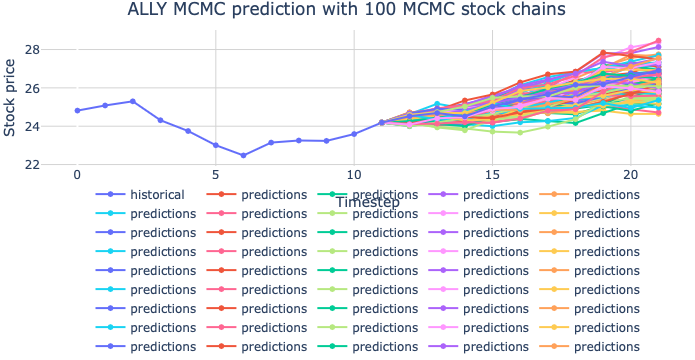

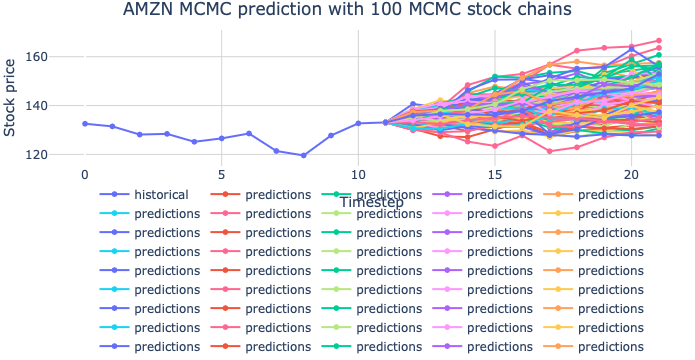

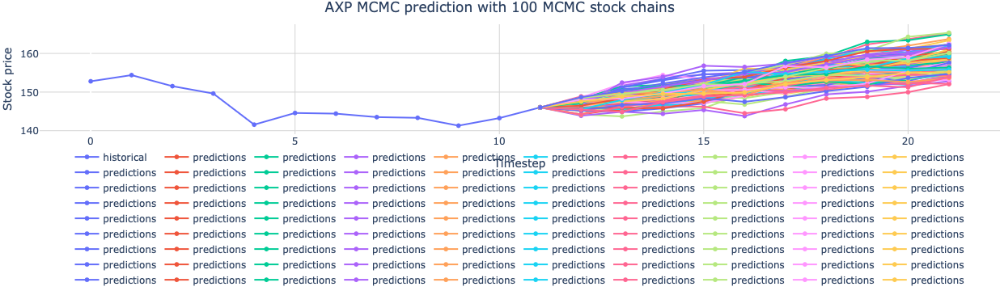

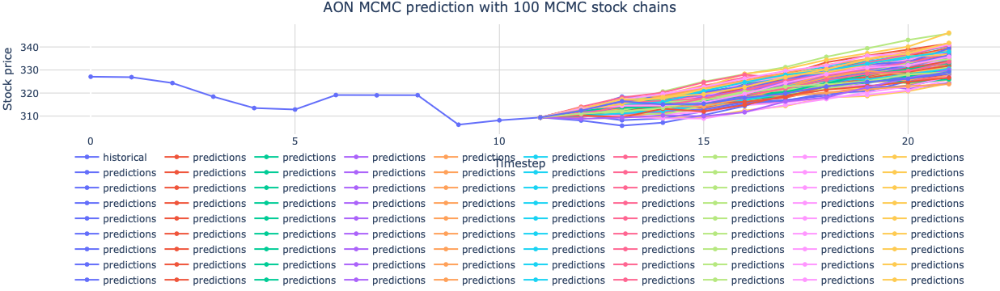

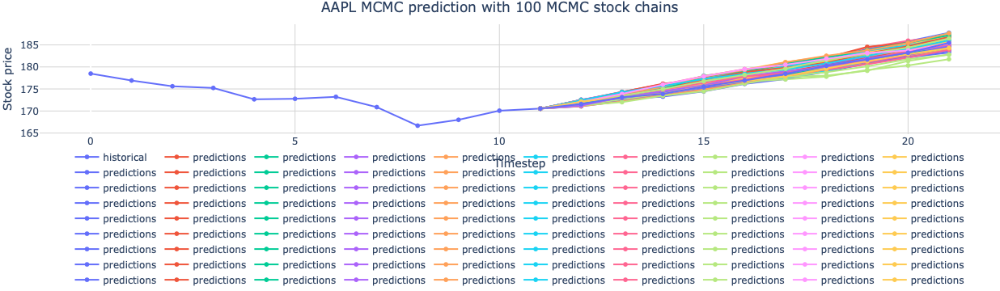

...

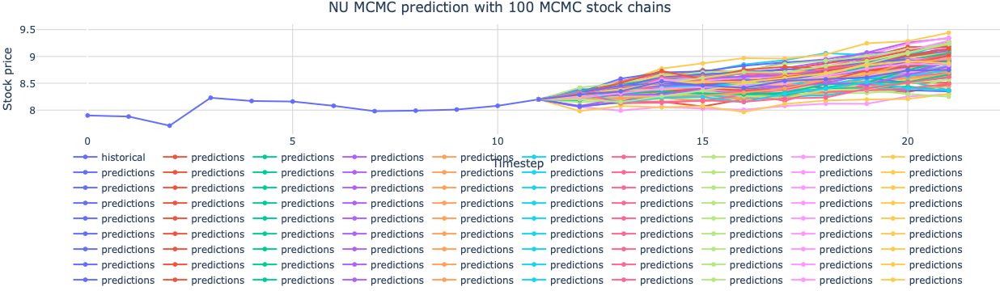

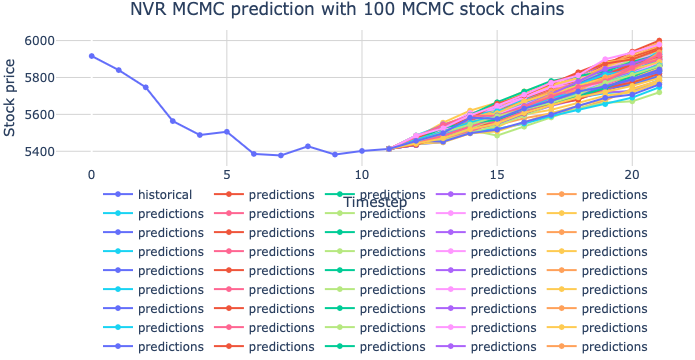

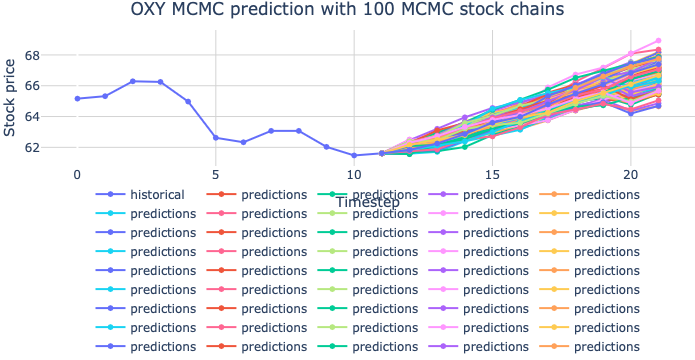

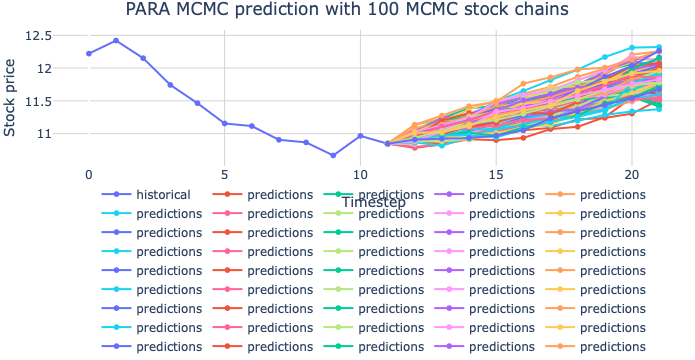

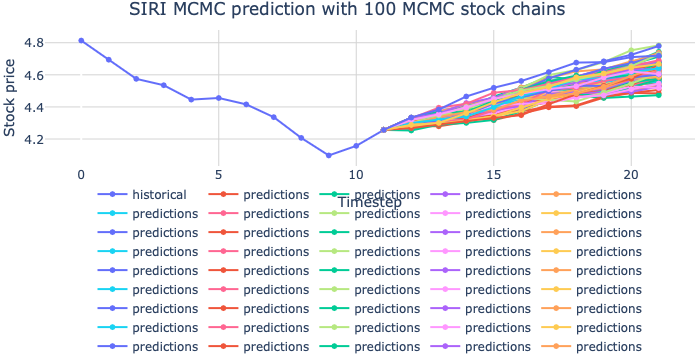

In [ ]:
#Now we are ready to perform Black Scholes Model
import plotly
import plotly.graph_objs as go
import plotly.express as px
import math
def MH(stock_name, data,n):
    #MH Function load the stock name want to analyze and stock data collected previously with expected # for MCMC chains
    #Output the prediction chains for stock price of that stock name
    #Input: Stock Name, Stock data, and total number of chains
    #Output: Prediction chains with size 12*n
    
    #Define basic parameters used in MH for black Scholes Model
    maturnity = 1
    #Find Volatility
    volatility = Volatility(stock_name,data)
    risk_free = 0.1
    steps = 12
    delta_t = maturnity / steps
    
    #Loading the stock data
    stock_data = data[stock_name]
    n_paths = n
    #i is the counter for MCMC. Total steps will be equal to 12 transaction days we want to predict
    i = 0
    #Initialize stock_price with very last historical price data
    stock_price = stock_data[-1]
    #Preallocate paths to store those MCMc chains on stock price prediction
    paths = np.full((steps,n_paths),stock_price)
    #Stock Price data cleaning for excluding nan and 0 data
    stock_data = stock_data.dropna()
    stock_data = np.array(stock_data)
    stock_data=stock_data[stock_data!=0]
    while i < steps-1:
        # Generate noise term using MCMC method
        pts = MCMC(n_paths)
        #based on Black Scholes Model, following random walk model formula. Find the brownian motion part
        dw = np.sqrt(dt)*pts
        #Update the path with formula
        paths[i+1] = paths[i] * np.exp((risk_free-1/2*volatility**2)*delta_t+volatility*dw)
        i = i + 1
    return paths.transpose()
def draw(stock_name,hist,pred,n_paths):
    #Function create procedure for output plot for given stock name, historical data, prediction data, and number of MCMC prediction chains
    #The plot part are modified based on 
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=list(range(0, 12)), y=hist, mode='lines+markers',  name='historical'))
    for i in range(n_paths):               
        fig.add_trace(go.Scatter(x=list(range(11,22)), y=pred[i], mode='lines+markers', name='predictions'))
    fig.update_layout(legend_orientation="h",
    legend=dict(x=.5, xanchor="center"),
    plot_bgcolor='#FFFFFF',  
    xaxis=dict(gridcolor = 'lightgrey'),
    yaxis=dict(gridcolor = 'lightgrey'),
    title_text = f'{stock_name} MCMC prediction with {n_paths} MCMC stock chains', title_x = 0.5,
    xaxis_title="Timestep",
    yaxis_title="Stock price",
    margin=dict(l=0, r=0, t=30, b=0))
    fig.show()
    
    
#Main
Return = []

for i in Stock_List:
    pred = MH(i,Adj_close,100)
    draw(i,Adj_close[i],pred,100)
    Fname = i+ " output.csv"
    Avgpre = np.mean(pred,axis=0)
    Last_Price = Adj_close[i].iloc[-1]
    #Calculating the return rate during 12 predicted days
    Return.append((Avgpre[-1]-Last_Price)/Last_Price)
    Outputdf = pd.DataFrame({"Average Prediction (12days after)": Avgpre, "Historical": Adj_close[i]})
    Outputdf.to_csv(Fname)
Returndf = pd.DataFrame({"Symbol": Stock_List, "12 days Return": Return})
Returndf.to_csv("Return.csv")
    